In [35]:
# Import packages
from client import ODPClient
import matplotlib.pyplot as plt
import folium.plugins
import getpass

# Connect to ODP
client = ODPClient(api_key=getpass.getpass(prompt='Insert your personal ODP API key:'),
                       project="odp", client_name="odp")
            

Insert your personal ODP API key:········


In [36]:
# Get the available casts in 2018
casts=client.get_available_casts(2018,2018)


In [33]:
casts

,date,lon,extId,time,geo_index,lat
cast_wod_3_2018_1414_19058029,20181125,-172.59800,cast_wod_3_2018_1414_19058029,90908.940972,1414,63.60200
cast_wod_3_2018_15419_18918967,20180907,-94.54000,cast_wod_3_2018_15419_18918967,90829.813194,15419,29.00000
cast_wod_3_2018_16777_19038946,20181203,-86.08800,cast_wod_3_2018_16777_19038946,90916.680556,16777,-53.96000
cast_wod_3_2018_18846_19552542,20180909,-75.28667,cast_wod_3_2018_18846_19552542,90831.638750,18846,35.14500
cast_wod_3_2018_18847_19552554,20180911,-75.49834,cast_wod_3_2018_18847_19552554,90833.092083,18847,36.30000
...,...,...,...,...,...,...
cast_wod_3_2018_61676_18777719,20180502,162.41400,cast_wod_3_2018_61676_18777719,90701.333333,61676,25.85900
cast_wod_3_2018_63291_18777851,20180505,171.36400,cast_wod_3_2018_63291_18777851,90704.541667,63291,20.16200
cast_wod_3_2018_63470_18777853,20180505,172.10000,cast_wod_3_2018_63470_18777853,90704.791667,63470,19.64600
cast_wod_3_2018_7764_19412404,20180420,-136.89848,cast_wod_3_2018_7764_19412404,90689.504167,7764,-66.99904


In [32]:
# Plot the casts on an interactive folium map
# Use the map to find markers of interest.
# Click the marker to get the id of the cast

m = folium.Map(location=[0, 0], zoom_start=2)

cluster = folium.plugins.MarkerCluster().add_to(m)
for i,cast in casts.iterrows():
    folium.Marker(location=[cast.lat, cast.lon], popup=cast.extId).add_to(cluster)
m

Text(0.5, 0, 'Temperature [deg C]')

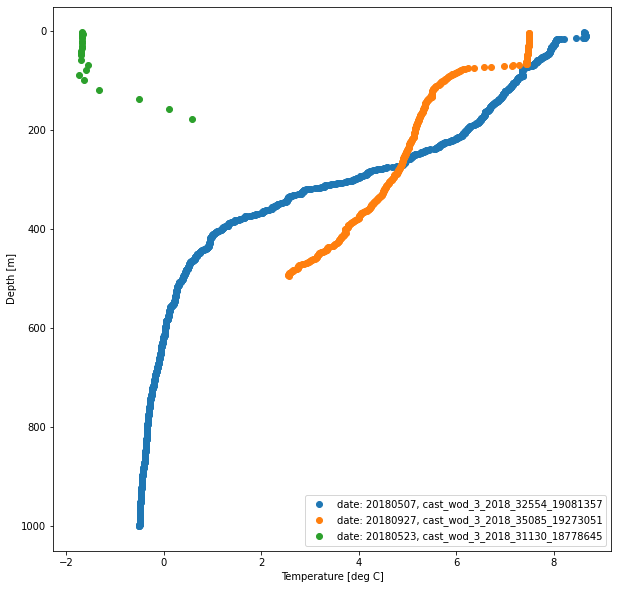

In [44]:
# Plot casts by adding the id to cast names

cast_names=['cast_wod_3_2018_32554_19081357','cast_wod_3_2018_35085_19273051','cast_wod_3_2018_31130_18778645']#,'cast_wod_3_2018_34350_19271207','cast_wod_3_2018_34350_19272109','cast_wod_3_2018_34350_19271593',
           #'cast_wod_3_2018_34350_19273300']

variable='Temperature'

plt.figure(figsize=(10,10))
legend=[]
for cast_name in cast_names:
    data=client.download_data_from_casts([cast_name])
    plt.scatter(data[variable],data.z)
    legend.append('date: {}, {}'.format(data.date.iloc[0],cast_name))

plt.legend(legend,loc=0)
plt.gca().invert_yaxis()   
plt.ylabel('Depth [m]')
plt.xlabel('Temperature [deg C]')


In [41]:
data

,date,lat,lon,z,z_WODflag,z_origflag,Oxygen,Oxygen_WODflag,Oxygen_origflag,Temperature,...,Chlorophyll_origflag,Pressure,Pressure_WODflag,Pressure_origflag,Nitrate,Nitrate_WODflag,Nitrate_origflag,pH,pH_WODflag,pH_origflag
0,20181126,59.883335,10.674334,2.971721,0,NaN,NaN,NaN,NaN,9.443000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20181126,59.883335,10.674334,3.962285,0,NaN,NaN,NaN,NaN,9.633000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20181126,59.883335,10.674334,4.952844,0,NaN,NaN,NaN,NaN,9.815001,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20181126,59.883335,10.674334,5.943398,0,NaN,NaN,NaN,NaN,10.008000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20181126,59.883335,10.674334,6.933949,0,NaN,NaN,NaN,NaN,10.040000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,20181126,59.883335,10.674334,7.924493,0,NaN,NaN,NaN,NaN,10.274000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,20181126,59.883335,10.674334,8.915033,0,NaN,NaN,NaN,NaN,10.778001,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,20181126,59.883335,10.674334,9.905568,0,NaN,NaN,NaN,NaN,10.635000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,20181126,59.883335,10.674334,10.896097,0,NaN,NaN,NaN,NaN,10.541000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,20181126,59.883335,10.674334,11.886624,0,NaN,NaN,NaN,NaN,10.387000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
